# Azure AutoML for Images (Object Detection)
## 2. AutoML for Images for object detection

This notebook focuses on AutoML for Object Detection using the Azure Machine Learning SDK (v2). It is designed to automate the process of training and deploying object detection models for image datasets.

## Key Features
Purpose: Streamline object detection workflows by leveraging Azure AutoML capabilities.

## Workflow Components:
- Data preparation and conversion (including VOC to JSONL format).
- AutoML configuration for object detection with primary metrics.
- Model training and evaluation.
- Deployment to Managed Online Endpoints with settings for probes and request handling.


Connect to Python 3.10 - SDK v2

In [ ]:
%pip install gradio

In [7]:
import json
import os
import xml.etree.ElementTree as ET


class JSONLConverter:
    """Base class for JSONL converters."""

    def __init__(self, base_url):
        self.jsonl_data = []
        self.base_url = base_url

    def convert(self):
        raise NotImplementedError


def write_json_lines(converter, filename):
    """Converts and writes a JSONL file."""
    json_lines_data = converter.convert()
    with open(filename, "w") as outfile:
        for json_line in json_lines_data:
            json.dump(json_line, outfile, separators=(",", ":"))
            outfile.write("\n")
        print(f"Conversion completed. Converted {len(json_lines_data)} lines.")


class VOCJSONLConverter(JSONLConverter):
    """Converts Pascal VOC XML annotations to JSONL for Azure AutoML object detection."""

    def __init__(self, base_url, xml_dir, mask_dir=None):
        super().__init__(base_url=base_url)
        self.xml_dir = xml_dir
        self.mask_dir = mask_dir

    def convert(self):
        json_line_sample = {
            "image_url": self.base_url,
            "image_details": {"format": None, "width": None, "height": None},
            "label": [],
        }

        for i, filename in enumerate(os.listdir(self.xml_dir)):
            if not filename.endswith(".xml"):
                print(f"Skipping unknown file: {filename}")
                continue

            annotation_filename = os.path.join(self.xml_dir, filename)
            print(f"Parsing {annotation_filename}")

            root = ET.parse(annotation_filename).getroot()
            width = int(root.find("size/width").text)
            height = int(root.find("size/height").text)

            labels = []
            for index, obj in enumerate(root.findall("object")):
                name = obj.find("name").text
                isCrowd = int(obj.find("difficult").text)
                xmin = obj.find("bndbox/xmin").text
                ymin = obj.find("bndbox/ymin").text
                xmax = obj.find("bndbox/xmax").text
                ymax = obj.find("bndbox/ymax").text

                labels.append({
                    "label": name,
                    "topX": float(xmin) / width,
                    "topY": float(ymin) / height,
                    "bottomX": float(xmax) / width,
                    "bottomY": float(ymax) / height,
                    "isCrowd": isCrowd,
                })

            image_filename = root.find("filename").text
            _, file_extension = os.path.splitext(image_filename)
            json_line = dict(json_line_sample)
            json_line["image_url"] = os.path.join(json_line["image_url"], image_filename)
            json_line["image_details"]["format"] = file_extension[1:]
            json_line["image_details"]["width"] = width
            json_line["image_details"]["height"] = height
            json_line["label"] = labels

            self.jsonl_data.append(json_line)
        return self.jsonl_data

In [2]:
import asyncio
import base64
import datetime
import gradio as gr
import io
import json
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches
import mlflow
import numpy as np
import os
import pandas as pd
import platform
import psutil
import random
import shutil
import sys
import tempfile
import threading
import time
import xml.etree.ElementTree as ET

from azure.ai.ml import automl, Input, MLClient
from azure.ai.ml.automl import ObjectDetectionPrimaryMetrics, SearchSpace
from azure.ai.ml.constants import AssetTypes, InputOutputModes
from azure.ai.ml.entities import (
    AmlCompute,
    CodeConfiguration,
    Data,
    Environment,
    ManagedOnlineEndpoint,
    ManagedOnlineDeployment,
    Model,
    OnlineRequestSettings,
    ProbeSettings,
)
from azure.ai.ml.sweep import BanditPolicy, Choice, Uniform
from azure.core.exceptions import ResourceNotFoundError
from azure.identity import DefaultAzureCredential
from concurrent.futures import ThreadPoolExecutor
from mlflow.tracking.client import MlflowClient
from pathlib import Path
from PIL import Image, ImageDraw, ImageFont
from typing import Tuple

/anaconda/envs/azureml_py310_sdkv2/lib/python3.10/site-packages/mlflow/__init__.py:41: UserWarning: Versions of mlflow (3.1.1) and mlflow-skinny (2.22.1) are different. This may lead to unexpected behavior. Please install the same version of both packages.
  mlflow.mismatch._check_version_mismatch()


## 1. Settings

In [20]:
IMAGES_DIR = "images"

PNG_DIR = os.path.join(IMAGES_DIR, "png")
LABELS_DIR = os.path.join(IMAGES_DIR, "labels")

In [21]:
MODEL_DIR = "model"

os.makedirs(MODEL_DIR, exist_ok=True)

In [22]:
RESULTS_DIR = "results"

os.makedirs(RESULTS_DIR, exist_ok=True)

In [58]:
IMAGES_DIR = 'test'

os.makedirs(IMAGES_DIR, exist_ok=True)

In [23]:
exp_name = f"pools-detection-automl"

In [44]:
tags = {
    "cloud provider": "Microsoft Azure",
    "data source": "https://www.kaggle.com/alexj21/swimming-pool-512x512",
    "department": "Data science",
    "topic": "Images object detection",
    "tools": "AutoML for images Azure ML",
    "usecase": "Swimming pool detection 2025",
    "version": "1.0",
}

tags

{'cloud provider': 'Microsoft Azure',
 'data source': 'https://www.kaggle.com/alexj21/swimming-pool-512x512',
 'department': 'Data science',
 'topic': 'Images object detection',
 'tools': 'AutoML for images Azure ML',
 'usecase': 'Swimming pool detection 2025',
 'version': '1.0'}

## 2. Helper

In [68]:
def read_image(image_path):
    """ 
    Reads an image file in binary mode and returns its contents as bytes.

    Args:
        image_path (str): The path to the image file to be read.

    Returns:
        bytes: The binary content of the image file.
    """
    with open(image_path, "rb") as f:
        return f.read()

In [67]:
def display_boxes(image_file, ground_truth_boxes):
    """
    Displays an image with annotated bounding boxes and labels using Matplotlib.

    Args:
        image_file (str): Path to the image file to display.
        ground_truth_boxes (list of dict): A list of dictionaries, each representing a bounding box with keys:
            - "label" (str): The label for the object (e.g., "swimming pool").
            - "topX" (float): Normalized x-coordinate of the top-left corner (0 to 1).
            - "topY" (float): Normalized y-coordinate of the top-left corner (0 to 1).
            - "bottomX" (float): Normalized x-coordinate of the bottom-right corner (0 to 1).
            - "bottomY" (float): Normalized y-coordinate of the bottom-right corner (0 to 1).

    Behavior:
        - Loads the image and displays it without axes.
        - Draws each bounding box in red with its corresponding label.
        - Prints the number of detected objects and their details to the console.

    Returns:
        None: The function displays the image with bounding boxes using Matplotlib.

    Raises:
        FileNotFoundError: If the image file does not exist.
        KeyError: If any expected key is missing in a bounding box dictionary.
    """
    plt.figure()
    img_np = mpimg.imread(image_file)
    img = Image.fromarray(img_np.astype("uint8"))
    img_w, img_h = img.size
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(img_np)
    ax.axis("off")
    color = "red"

    # Bounding boxes
    print(f"🏊 Number of swimming pools = {len(ground_truth_boxes)}\n")
    print(ground_truth_boxes)

    for gt in ground_truth_boxes:
        label = gt["label"]
        xmin, ymin, xmax, ymax = gt["topX"], gt["topY"], gt["bottomX"], gt[
            "bottomY"]
        topleft_x, topleft_y = img_w * xmin, img_h * ymin
        width, height = img_w * (xmax - xmin), img_h * (ymax - ymin)

        # Display bounding box
        rect = patches.Rectangle((topleft_x, topleft_y),
                                 width,
                                 height,
                                 linewidth=3,
                                 edgecolor=color,
                                 facecolor="none")
        ax.add_patch(rect)
        ax.text(topleft_x, topleft_y - 10, label, color=color, fontsize=18)

    plt.show()

In [69]:
def display_boxes_jsonl(image_file, jsonl_file):
    """
    Displays bounding boxes for a given image using ground truth data from a JSONL file.

    This function searches for the specified image in a JSON Lines (JSONL) file containing
    ground truth annotations. If a matching entry is found, it calls `display_boxes` to
    visualize the bounding boxes on the image. If no match is found, it prints a message.

    Args:
        image_file (str): Path to the image file to display.
        jsonl_file (str): Path to the JSONL file containing ground truth annotations.
            Each line in the file should be a JSON object with:
            - "image_url" (str): The filename or URL of the image.
            - "label" (list of dict): A list of bounding box dictionaries with keys:
                * "label" (str): Object label.
                * "topX", "topY", "bottomX", "bottomY" (float): Normalized coordinates (0 to 1).

    Behavior:
        - Reads the JSONL file line by line.
        - Matches the base name of `image_file` with the "image_url" field.
        - If found, displays the image with bounding boxes using `display_boxes`.
        - Prints a message if no ground truth data is found.

    Returns:
        None: Displays the image with bounding boxes or prints a message.

    Raises:
        FileNotFoundError: If `image_file` or `jsonl_file` does not exist.
        json.JSONDecodeError: If a line in the JSONL file is not valid JSON.
        KeyError: If expected keys ("image_url" or "label") are missing.
    """
    image_base_name = os.path.basename(image_file)
    ground_truth_data_found = False

    with open(jsonl_file) as fp:
        for line in fp.readlines():
            line_json = json.loads(line)
            filename = line_json["image_url"]
            if image_base_name in filename:
                ground_truth_data_found = True
                display_boxes(image_file, line_json["label"])
                break

    if not ground_truth_data_found:
        print("Unable to find ground truth information for image: {}".format(
            image_file))

In [17]:
def create_ml_table_file(filename):
    """
    Generates an MLTable definition string for Azure Machine Learning datasets.

    This function creates a YAML-formatted string that defines an MLTable configuration
    for reading a JSON Lines file and converting a specific column type. The resulting
    string can be saved as an `MLTable` file for use in Azure ML pipelines.

    Args:
        filename (str): The name of the JSONL file to include in the MLTable definition.

    Returns:
        str: A YAML-formatted string specifying:
            - The file path to the dataset.
            - Transformations to apply:
                * Read JSON Lines with UTF-8 encoding.
                * Handle invalid lines as errors.
                * Exclude the path column.
                * Convert the `image_url` column to `stream_info` type.
    """
    return ("paths:\n"
            "  - file: ./{0}\n"
            "transformations:\n"
            "  - read_json_lines:\n"
            "        encoding: utf8\n"
            "        invalid_lines: error\n"
            "        include_path_column: false\n"
            "  - convert_column_types:\n"
            "      - columns: image_url\n"
            "        column_type: stream_info").format(filename)

In [18]:
def save_ml_table_file(output_path, mltable_file_contents):
    """
    Saves an MLTable definition to a file named 'MLTable' in the specified output directory.

    Args:
        output_path (str): The directory where the MLTable file will be created.
        mltable_file_contents (str): The YAML-formatted MLTable definition content to write.

    Behavior:
        - Creates (or overwrites) a file named 'MLTable' in the given output directory.
        - Writes the provided MLTable content to the file.

    Returns:
        None

    Raises:
        FileNotFoundError: If the specified output directory does not exist.
        IOError: If there is an error writing to the file.
    """
    with open(os.path.join(output_path, "MLTable"), "w") as f:
        f.write(mltable_file_contents)

In [65]:
def pools_detection(image_file: str) -> dict:
    """
    Detect pools in an image using an Azure ML online endpoint.

    Args:
        image_file (str): Path to the image file.
        ml_client (MLClient): Azure ML client instance.
        online_endpoint_name (str): Name of the online endpoint.
        deployment_name (str): Name of the deployment.

    Returns:
        dict: JSON response from the endpoint.
    """
    try:
        # Read and encode image
        with open(image_file, "rb") as img:
            encoded_image = base64.encodebytes(img.read()).decode("utf-8")

        # Prepare request payload
        request_json = {
            "input_data": {
                "columns": ["image"],
                "data": [encoded_image],
            }
        }

        # Save request to file
        request_file_name = os.path.join(MODEL_DIR, "request.json")
        with open(request_file_name, "w") as request_file:
            json.dump(request_json, request_file)

        # Invoke endpoint
        response = ml_client.online_endpoints.invoke(
            endpoint_name=online_endpoint_name,
            deployment_name=deployment.name,
            request_file=request_file_name,
        )

        results = json.loads(response)
        print(f"Predictions for image {image_file}:\n")

        for item_idx, item in enumerate(results, 1):
            boxes = item.get('boxes', [])
            print(f"💧 Number of swimming pools = {len(boxes)}\n")

            for box_idx, detection in enumerate(boxes, 1):
                label = detection.get('label', 'unknown').upper()
                score = detection.get('score', 0)
                box = detection.get('box', {})
                # Color code based on confidence score
                if score >= 0.80:
                    confidence_emoji = "🟢"
                elif score >= 0.70:
                    confidence_emoji = "🟡"
                else:
                    confidence_emoji = "🟠"
                print(
                    f"{box_idx}: {label} with score = {score:.3%} {confidence_emoji}"
                )
                print(
                    f"Top-Left = ({box.get('topX', 0):.4f}, {box.get('topY', 0):.4f}) Bottom-Right: ({box.get('bottomX', 0):.4f}, {box.get('bottomY', 0):.4f})"
                )
                print()
        return results

    except FileNotFoundError:
        raise ValueError(f"Image file '{image_file}' not found.")
    except Exception as e:
        raise RuntimeError(f"Error during pool detection: {e}")

In [66]:
def visualize_predictions(image_file,
                          predictions,
                          min_confidence=0.7,
                          figsize=(8, 8)):
    """
    Display an image with bounding boxes for predictions above a confidence threshold.

    Parameters:
    - image_file (str): Path to the image file.
    - predictions (list): List of prediction dictionaries with 'label', 'score', and 'box'.
    - min_confidence (float): Minimum confidence to display a bounding box.
    - figsize (tuple): Size of the matplotlib figure.
    """
    # Load image
    image_array = mpimg.imread(image_file)
    pil_image = Image.fromarray(image_array.astype("uint8"))
    image_width, image_height = pil_image.size

    # Create plot
    fig, axis = plt.subplots(1, figsize=figsize)
    plt.axis('off')
    axis.imshow(image_array)
    color = "cyan"

    nb = len(predictions[0]["boxes"])
    print(f"Total number of swimming pools = {nb}\n")

    idx = 1
    # Draw bounding boxes
    for detection in predictions[0]["boxes"]:
        confidence = detection["score"]

        if confidence >= min_confidence:
            bbox = detection["box"]
            y_start, x_start = bbox["topY"], bbox["topX"]
            y_end, x_end = bbox["bottomY"], bbox["bottomX"]

            box_left = image_width * x_start
            box_top = image_height * y_start
            box_width = image_width * (x_end - x_start)
            box_height = image_height * (y_end - y_start)

            # Print details
            print(
                f"{idx:02} {detection['label']} = {confidence:.2f} "
                f"[x:{box_left:.3f}, y:{box_top:.3f}, w:{box_width:.3f}, h:{box_height:.3f}]"
            )

            idx += 1
            # Draw rectangle
            bounding_box = patches.Rectangle(
                xy=(box_left, box_top),
                width=box_width,
                height=box_height,
                linewidth=3,
                edgecolor=color,
                facecolor="none",
            )
            axis.add_patch(bounding_box)

            # Add label text
            plt.text(box_left,
                     box_top - 10,
                     f"{detection['label']} = {confidence:.2f}",
                     color=color,
                     fontsize=12)

            # Add label text
            plt.text(10,
                     20,
                     f"{nb} detected swimming pools in '{image_file}'",
                     color=color,
                     fontsize=12)

            # Add label text
            now = datetime.datetime.today().strftime('%d-%b-%Y %H:%M:%S')
            plt.text(10,
                     40,
                     f"[{now}] Powered by Azure AutoML for Images",
                     color=color,
                     fontsize=12)

    plt.show()

## 3. Our images and their labels

In [21]:
nb_png = len([f for f in os.listdir(PNG_DIR) if f.endswith('.png')])
print(f"🖼️ Total of .png images files = {nb_png}")

nb_xml = len([f for f in os.listdir(LABELS_DIR) if f.endswith('.xml')])
print(f"🏷️ Total of .xml labels files = {nb_xml}")

🖼️ Total of .png images files = 827
🏷️ Total of .xml labels files = 1224


### Visualizing some images with their Pascal VOC labels

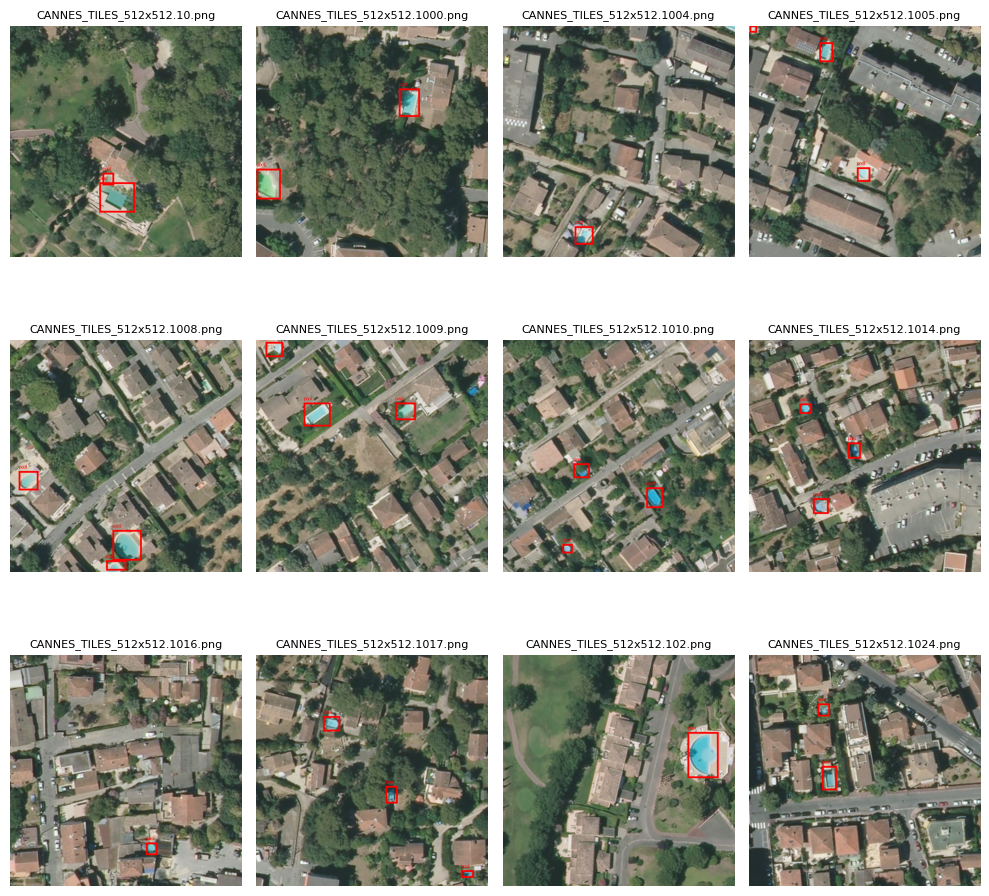

In [22]:
image_files = sorted([
    f for f in os.listdir(PNG_DIR) if f.endswith(('.jpg', '.jpeg', '.png'))])[:12]
fig, axes = plt.subplots(3, 4, figsize=(10, 10))
axes = axes.flatten()

color = "red"

for idx, image_file in enumerate(image_files):
    image_path = os.path.join(PNG_DIR, image_file)
    label_file = image_file.rsplit('.', 1)[0] + '.xml'
    label_path = os.path.join(LABELS_DIR, label_file)

    img = Image.open(image_path)
    draw = ImageDraw.Draw(img)

    if os.path.exists(label_path):
        tree = ET.parse(label_path)
        root = tree.getroot()

        for obj in root.findall('object'):
            if obj.find('name').text == 'pool':
                bbox = obj.find('bndbox')
                xmin = int(bbox.find('xmin').text)
                ymin = int(bbox.find('ymin').text)
                xmax = int(bbox.find('xmax').text)
                ymax = int(bbox.find('ymax').text)
                draw.rectangle([xmin, ymin, xmax, ymax],
                               outline=color,
                               width=4)
                draw.text((xmin, ymin - 15), 'pool', fill=color)

    axes[idx].imshow(img)
    axes[idx].axis('off')
    axes[idx].set_title(f"{image_file}", fontsize=8)

plt.tight_layout()
plt.show()

## 4. Connecting to Azure ML

In [ ]:
credential = DefaultAzureCredential()

ml_client = MLClient.from_config(credential=credential)

## 5. Creating GPU cluster

An Azure Machine Learning (Azure ML) compute cluster is a managed cloud-based resource that provides scalable compute power for training and batch inference jobs in Azure ML.

In [26]:
compute_name = "gpu-cluster"

try:
    compute = ml_client.compute.get(compute_name)
    print(f"✅ Found existing compute cluster '{compute_name}'")

except ResourceNotFoundError:
    print(f"🛠️ Creating new compute cluster '{compute_name}'.")
    compute_config = AmlCompute(
        name=compute_name,
        type="amlcompute",
        size="Standard_NC16as_T4_v3",  # GPU compute clusters
        idle_time_before_scale_down=1200,  # in secs
        min_instances=0,
        max_instances=4,
    )

    ml_client.compute.begin_create_or_update(compute_config).result()
    print("✅ Done.")

ActivityCompleted: Activity=Compute.Get, HowEnded=Failure, Duration=995.06 [ms], Exception=ResourceNotFoundError, ErrorCategory=UserError, ErrorMessage=Operation returned an invalid status 'Not Found'


🛠️ Creating new compute cluster 'gpu-cluster'.
✅ Done.


In [27]:
compute_details = ml_client.compute.get(compute_name)

print(f"✅ Compute name: {compute_details.name}")
print(f"🔧 Compute type: {compute_details.type}")
print(f"📦 VM size: {compute_details.size}")
print(f"📉 Min instances: {compute_details.min_instances}")
print(f"📈 Max instances: {compute_details.max_instances}")
print(f"⏳ Idle time before scale down: {compute_details.idle_time_before_scale_down:.0f} seconds")
print(f"📍 Location: {compute_details.location}")
print(f"📅 Provisioning state: {compute_details.provisioning_state}")

✅ Compute name: gpu-cluster
🔧 Compute type: amlcompute
📦 VM size: Standard_NC16as_T4_v3
📉 Min instances: 0
📈 Max instances: 4
⏳ Idle time before scale down: 1200 seconds
📍 Location: eastus
📅 Provisioning state: Succeeded


The SKU Standard_NC16as_T4_v3 refers to an Azure GPU-enabled virtual machine type optimized for AI/ML workloads. 
- NVIDIA T4 Tensor Core (4 GPUs per VM)
- 220 GB RAM
- Built for CUDA, TensorRT, and popular ML frameworks (PyTorch, TensorFlow).
- Supports multi-GPU scaling for distributed training.
- https://learn.microsoft.com/en-us/azure/virtual-machines/sizes/gpu-accelerated/ncast4v3-series?tabs=sizebasic

## 6. Connecting to Azure ML and data management

In [28]:
my_data = Data(
    path="./images/png",  # Link to the local images files
    type=AssetTypes.URI_FOLDER,
    name="swimming-pool-images-detection-ds",
    description="swimming pool images for object detection",
)

uri_folder_data_asset = ml_client.data.create_or_update(my_data)
print(uri_folder_data_asset)

Your file exceeds 100 MB. If you experience low speeds, latency, or broken connections, we recommend using the AzCopyv10 tool for this file transfer.

Example: azcopy copy '/mnt/batch/tasks/shared/LS_root/mounts/clusters/trener011/code/images/png' 'https://amlsms013323819254.blob.core.windows.net/azureml-blobstore-f3014e77-aaaa-49b2-8a0c-fd1add839d41/LocalUpload/3b8a309c34f4cbacb5a40e1fde6ac39dc76dbaacf8c45b80d19bac18b620ca16/png' 

See https://learn.microsoft.com/azure/storage/common/storage-use-azcopy-v10 for more information.
Uploading png (1250.2 MBs): 100%|██████████| 1250202582/1250202582 [00:59<00:00, 20884837.11it/s]




creation_context:
  created_at: '2026-02-11T18:08:33.418619+00:00'
  created_by: Marcin Szeliga
  created_by_type: User
  last_modified_at: '2026-02-11T18:08:33.430614+00:00'
description: swimming pool images for object detection
id: /subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourceGroups/amls/providers/Microsoft.MachineLearningServices/workspaces/amlsms01/data/swimming-pool-images-detection-ds/versions/1
name: swimming-pool-images-detection-ds
path: azureml://subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourcegroups/amls/workspaces/amlsms01/datastores/workspaceblobstore/paths/LocalUpload/3b8a309c34f4cbacb5a40e1fde6ac39dc76dbaacf8c45b80d19bac18b620ca16/png/
properties: {}
tags: {}
type: uri_folder
version: '1'



In [29]:
print(f"Path to folder in Azure Blob Storage: {uri_folder_data_asset.path}")

Path to folder in Azure Blob Storage: azureml://subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourcegroups/amls/workspaces/amlsms01/datastores/workspaceblobstore/paths/LocalUpload/3b8a309c34f4cbacb5a40e1fde6ac39dc76dbaacf8c45b80d19bac18b620ca16/png/


### From VOC to JSONL (required for AutoML)

In [30]:
base_url = os.path.join(uri_folder_data_asset.path)
converter = VOCJSONLConverter(base_url, LABELS_DIR)

jsonl_annotations = os.path.join(IMAGES_DIR, "annotations_voc.jsonl")
write_json_lines(converter, jsonl_annotations)

Parsing images/labels/CANNES_TILES_512x512.10.xml
Parsing images/labels/CANNES_TILES_512x512.1000.xml
Parsing images/labels/CANNES_TILES_512x512.1001.xml
Parsing images/labels/CANNES_TILES_512x512.1004.xml
Parsing images/labels/CANNES_TILES_512x512.1005.xml
Parsing images/labels/CANNES_TILES_512x512.1008.xml
Parsing images/labels/CANNES_TILES_512x512.1009.xml
Parsing images/labels/CANNES_TILES_512x512.1010.xml
Parsing images/labels/CANNES_TILES_512x512.1013.xml
Parsing images/labels/CANNES_TILES_512x512.1014.xml
Parsing images/labels/CANNES_TILES_512x512.1016.xml
Parsing images/labels/CANNES_TILES_512x512.1017.xml
Parsing images/labels/CANNES_TILES_512x512.1018.xml
Parsing images/labels/CANNES_TILES_512x512.1019.xml
Parsing images/labels/CANNES_TILES_512x512.102.xml
Parsing images/labels/CANNES_TILES_512x512.1024.xml
Parsing images/labels/CANNES_TILES_512x512.1026.xml
Parsing images/labels/CANNES_TILES_512x512.1028.xml
Parsing images/labels/CANNES_TILES_512x512.1030.xml
Parsing images/

### Testing the generated JSONL labels structure

🖼️ Image file: images/png/CANNES_TILES_512x512.335.png
🏷️ Using jsonl file bounding boxes: images/annotations_voc.jsonl

🏊 Number of swimming pools = 2

[{'label': 'pool', 'topX': 0.056640625, 'topY': 0.103515625, 'bottomX': 0.19140625, 'bottomY': 0.1875, 'isCrowd': 0}, {'label': 'pool', 'topX': 0.779296875, 'topY': 0.09765625, 'bottomX': 0.90625, 'bottomY': 0.169921875, 'isCrowd': 0}]


<Figure size 640x480 with 0 Axes>

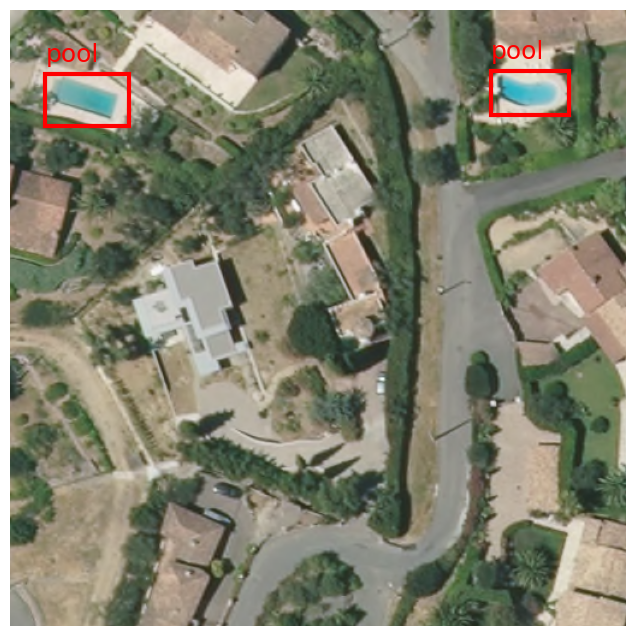

In [31]:
image_file = os.path.join(IMAGES_DIR, "png", "CANNES_TILES_512x512.335.png")

print(f"🖼️ Image file: {image_file}")
print(f"🏷️ Using jsonl file bounding boxes: {jsonl_annotations}\n")

display_boxes_jsonl(image_file, jsonl_annotations)

## Partitioning: creating the training and validation structures

In [32]:
# We'll copy each JSONL file within its related MLTable folder
training_mltable_path = os.path.join(IMAGES_DIR, "training-mltable-folder")
validation_mltable_path = os.path.join(IMAGES_DIR, "validation-mltable-folder")

# First, let's create the folders if they don't exist
os.makedirs(training_mltable_path, exist_ok=True)
os.makedirs(validation_mltable_path, exist_ok=True)

train_validation_ratio = 4  # = Training: 80%, val: 20%

# Path to the training and validation files
train_annotations_file = os.path.join(training_mltable_path,
                                      "train_annotations.jsonl")
validation_annotations_file = os.path.join(validation_mltable_path,
                                           "validation_annotations.jsonl")

with open(jsonl_annotations, "r") as annot_f:
    json_lines = annot_f.readlines()

index = 0
with open(train_annotations_file, "w") as train_f:
    with open(validation_annotations_file, "w") as validation_f:
        for json_line in json_lines:
            if index % train_validation_ratio == 0:
                # validation annotation
                validation_f.write(json_line)
            else:
                # train annotation
                train_f.write(json_line)
            index += 1

In [33]:
!ls $train_annotations_file -lh

-rwxrwxrwx 1 root root 544K Feb 11 18:13 images/training-mltable-folder/train_annotations.jsonl


In [34]:
!ls $validation_annotations_file -lh

-rwxrwxrwx 1 root root 187K Feb 11 18:13 images/validation-mltable-folder/validation_annotations.jsonl


### Testing the JSONL training label structure

🖼️ Image file: images/png/CANNES_TILES_512x512.1000.png
🏷️ Using jsonl file bounding boxes: images/training-mltable-folder/train_annotations.jsonl

🏊 Number of swimming pools = 2

[{'label': 'pool', 'topX': 0.615234375, 'topY': 0.2734375, 'bottomX': 0.705078125, 'bottomY': 0.39453125, 'isCrowd': 0}, {'label': 'pool', 'topX': 0.001953125, 'topY': 0.619140625, 'bottomX': 0.10546875, 'bottomY': 0.75, 'isCrowd': 0}]


<Figure size 640x480 with 0 Axes>

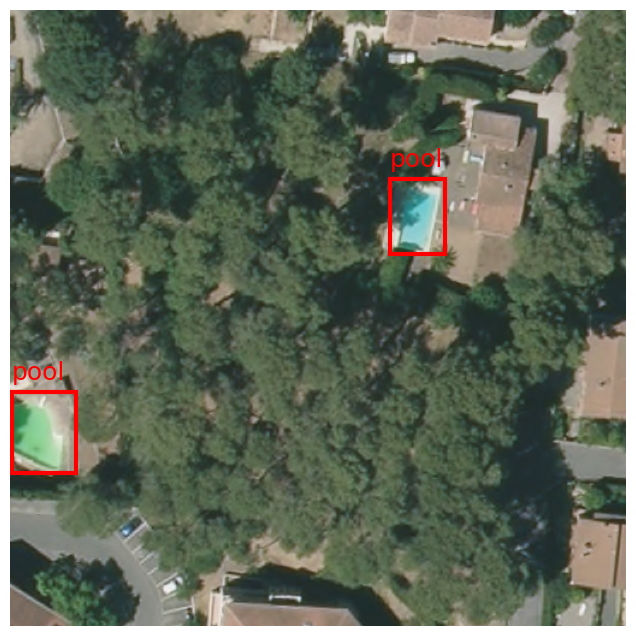

In [35]:
image_file = os.path.join(IMAGES_DIR, "png", "CANNES_TILES_512x512.1000.png")

print(f"🖼️ Image file: {image_file}")
print(f"🏷️ Using jsonl file bounding boxes: {train_annotations_file}\n")
display_boxes_jsonl(image_file, train_annotations_file)

### Testing the JSONL validation label structure

🖼️ Image file: images/png/CANNES_TILES_512x512.10.png
🏷️ Using jsonl file bounding boxes: images/validation-mltable-folder/validation_annotations.jsonl

🏊 Number of swimming pools = 2

[{'label': 'pool', 'topX': 0.3984375, 'topY': 0.63671875, 'bottomX': 0.447265625, 'bottomY': 0.689453125, 'isCrowd': 0}, {'label': 'pool', 'topX': 0.384765625, 'topY': 0.677734375, 'bottomX': 0.537109375, 'bottomY': 0.806640625, 'isCrowd': 0}]


<Figure size 640x480 with 0 Axes>

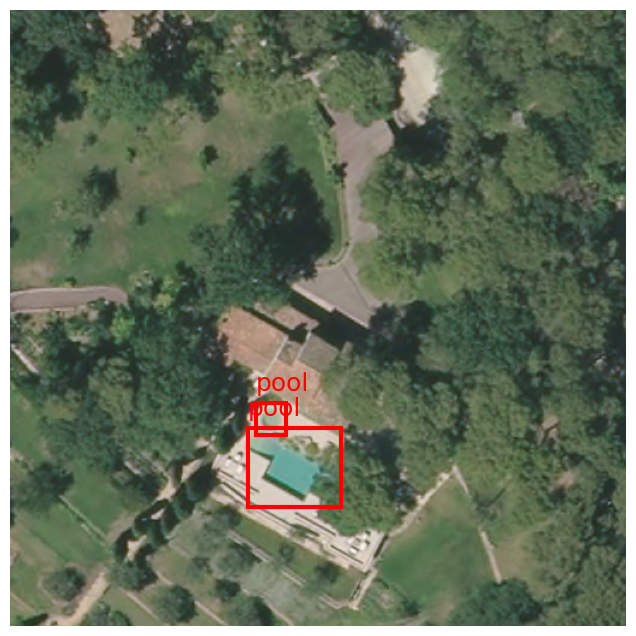

In [36]:
image_file = os.path.join(IMAGES_DIR, "png", "CANNES_TILES_512x512.10.png")

print(f"🖼️ Image file: {image_file}")
print(f"🏷️ Using jsonl file bounding boxes: {validation_annotations_file}\n")
display_boxes_jsonl(image_file, validation_annotations_file)

### Creating the train & validation mltables

In [37]:
# Create and save train mltable
train_mltable_file_contents = create_ml_table_file(
    os.path.basename(train_annotations_file))
save_ml_table_file(training_mltable_path, train_mltable_file_contents)

# Save train and validation mltable
validation_mltable_file_contents = create_ml_table_file(
    os.path.basename(validation_annotations_file))
save_ml_table_file(validation_mltable_path, validation_mltable_file_contents)

In [38]:
# Training MLTable defined locally, with local data to be uploaded
my_training_data_input = Input(type=AssetTypes.MLTABLE,
                               path=training_mltable_path)

# Validation MLTable defined locally, with local data to be uploaded
my_validation_data_input = Input(type=AssetTypes.MLTABLE,
                                 path=validation_mltable_path)

In [39]:
my_training_data_input, my_validation_data_input

({'type': 'mltable', 'path': 'images/training-mltable-folder'},
 {'type': 'mltable', 'path': 'images/validation-mltable-folder'})

## 7. AutoML for object detection

AutoML allows you to easily train models for Image Classification, Object Detection & Instance Segmentation on your image data. You can control the model algorithm and hyperparameters to be used, perform a sweep over a manually specified hyperparameter space, or the system can automatically perform a hyperparameter sweep for you.

Available models for object detection :
- `YOLOv5 (default model)`
- `Faster R-CNN ResNet18 FPN`
- `Faster R-CNN ResNet34 FPN`
- `Faster R-CNN ResNet50 FPN`
- `Faster R-CNN ResNet101 FPN`
- `Faster R-CNN ResNet152 FPN`
- `RetinaNet ResNet50 FPN`


| Model                          | Type       | Speed      | Accuracy    | Best For                          |
|--------------------------------|-----------|-----------|------------|-----------------------------------|
| YOLOv5                         | One-stage | Very High | Medium      | Real-time detection              |
| Faster R-CNN ResNet18/34       | Two-stage | Medium    | Medium      | Lightweight, moderate accuracy   |
| Faster R-CNN ResNet50          | Two-stage | Low       | High        | Balanced performance             |
| Faster R-CNN ResNet101/152     | Two-stage | Low       | Very High   | Accuracy-critical tasks          |
| RetinaNet ResNet50             | One-stage | High      | High        | Dense object detection           |

> https://learn.microsoft.com/en-us/azure/machine-learning/how-to-auto-train-image-models?view=azureml-api-2&tabs=python#supported-model-architectures

### 1. Copilot mode (all models will be evaluated)

In [40]:
copilot_object_detection_job = automl.image_object_detection(
    compute=compute_name,  # GPU compute cluster
    experiment_name=exp_name,  # Experimentation name 
    training_data=my_training_data_input,  # Training images
    validation_data=my_validation_data_input,  # Validation images
    target_column_name="label",  # Target
    primary_metric="mean_average_precision",  # Metric
    tags=tags,
)

copilot_object_detection_job.set_limits(
    max_trials=7,  # Sets the maximum number of trials that AutoML will try.
    max_concurrent_trials=4,  # Sets the maximum number of trials that can run in parallel.
    timeout_minutes=60,  # Default value is 7 days (max allowed is 60 days)
)

In [41]:
print("Submitting AutoML job")
returned_job = ml_client.jobs.create_or_update(copilot_object_detection_job)
print(f"✅ Created job: {returned_job}")

Submitting AutoML job


Uploading training-mltable-folder (0.56 MBs): 100%|██████████| 556443/556443 [00:00<00:00, 7272863.85it/s]


Uploading validation-mltable-folder (0.19 MBs): 100%|██████████| 191512/191512 [00:00<00:00, 2488165.82it/s]




✅ Created job: compute: azureml:gpu-cluster
creation_context:
  created_at: '2026-02-11T18:15:03.977679+00:00'
  created_by: Marcin Szeliga
  created_by_type: User
display_name: silly_iron_tm7f4s3zz8
experiment_name: pools-detection-automl
id: azureml:/subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourceGroups/amls/providers/Microsoft.MachineLearningServices/workspaces/amlsms01/jobs/silly_iron_tm7f4s3zz8
limits:
  max_concurrent_trials: 4
  max_trials: 7
  timeout_minutes: 240
log_verbosity: info
name: silly_iron_tm7f4s3zz8
outputs: {}
primary_metric: mean_average_precision
properties: {}
queue_settings:
  job_tier: 'null'
resources:
  instance_count: 1
  shm_size: 2g
services:
  Studio:
    endpoint: https://ml.azure.com/runs/silly_iron_tm7f4s3zz8?wsid=/subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourcegroups/amls/workspaces/amlsms01&tid=f2535698-777b-42c7-9f85-1aa8546d22fa
  Tracking:
    endpoint: azureml://eastus.api.azureml.ms/mlflow/v1.0/subscriptions/e7855339-6cf

In [42]:
print(f"\n{'='*70}")
print(f"Job submitted successfully!")
print(f"{'='*70}")
print(f"Job name: {returned_job.name}")
print(f"Job status: {returned_job.status}")
print(f"Job studio URL: {returned_job.studio_url}")
print(f"{'='*70}")
print("\nYou can monitor the job progress in Azure ML Studio using the URL above.")


Job submitted successfully!
Job name: silly_iron_tm7f4s3zz8
Job status: NotStarted
Job studio URL: https://ml.azure.com/runs/silly_iron_tm7f4s3zz8?wsid=/subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourcegroups/amls/workspaces/amlsms01&tid=f2535698-777b-42c7-9f85-1aa8546d22fa

You can monitor the job progress in Azure ML Studio using the URL above.


In [43]:
print(f"✅ Created job: {returned_job}")

✅ Created job: compute: azureml:gpu-cluster
creation_context:
  created_at: '2026-02-11T18:15:03.977679+00:00'
  created_by: Marcin Szeliga
  created_by_type: User
display_name: silly_iron_tm7f4s3zz8
experiment_name: pools-detection-automl
id: azureml:/subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourceGroups/amls/providers/Microsoft.MachineLearningServices/workspaces/amlsms01/jobs/silly_iron_tm7f4s3zz8
limits:
  max_concurrent_trials: 4
  max_trials: 7
  timeout_minutes: 240
log_verbosity: info
name: silly_iron_tm7f4s3zz8
outputs: {}
primary_metric: mean_average_precision
properties: {}
queue_settings:
  job_tier: 'null'
resources:
  instance_count: 1
  shm_size: 2g
services:
  Studio:
    endpoint: https://ml.azure.com/runs/silly_iron_tm7f4s3zz8?wsid=/subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourcegroups/amls/workspaces/amlsms01&tid=f2535698-777b-42c7-9f85-1aa8546d22fa
  Tracking:
    endpoint: azureml://eastus.api.azureml.ms/mlflow/v1.0/subscriptions/e7855339-6cf

In [44]:
job = ml_client.jobs.get(returned_job.name)
print(f"✅ Status: {job.status}")

✅ Status: Running


In [46]:
ml_client.jobs.get(returned_job.name)

Experiment,Name,Type,Status,Details Page
pools-detection-automl,silly_iron_tm7f4s3zz8,automl,Running,Link to Azure Machine Learning studio


In [3]:
credential = DefaultAzureCredential()

ml_client = MLClient.from_config(credential=credential)

Found the config file in: /config.json


In [4]:
job = ml_client.jobs.get("silly_iron_tm7f4s3zz8")
print(f"✅ Status: {job.status}")

✅ Status: Completed


### 2. Manual hyperparameter sweeping for your model

When training computer vision models, model performance depends heavily on the hyperparameter values selected. Often, you might want to tune the hyperparameters to get optimal performance. For computer vision tasks, you can sweep hyperparameters to find the optimal settings for your model. This feature applies the hyperparameter tuning capabilities in Azure Machine Learning. 

> https://learn.microsoft.com/en-us/azure/machine-learning/how-to-tune-hyperparameters?view=azureml-api-2

In [52]:
hp_object_detection_job = automl.image_object_detection(
    compute=compute_name,  # Compute instance
    experiment_name=exp_name,  # Experiment name
    training_data=my_training_data_input,  # Training images
    validation_data=my_validation_data_input,  # Validation images
    target_column_name="label",  # Target to predict
    primary_metric=ObjectDetectionPrimaryMetrics.MEAN_AVERAGE_PRECISION,  # Metric
    tags=tags,  # Descriptive tags (optional)
)

In [53]:
# Set limits
hp_object_detection_job.set_limits(
    timeout_minutes=120,  #  Default value is 7 days (max allowed is 60 days)
    max_trials=5,  # Sets the maximum number of trials that AutoML will try.
    max_concurrent_trials=4,  # Sets the maximum number of trials that can run in parallel.
)

hp_object_detection_job.set_training_parameters(
    early_stopping=True,  # Enables the early stopping feature during training.
    evaluation_frequency=1  # How often (in epochs or iterations) the model’s performance is evaluated on the validation set during training.
)

# Configure sweep settings
hp_object_detection_job.set_sweep(
    sampling_algorithm="random",  # values are: random, grid, bayesian
    early_termination=BanditPolicy(
        evaluation_interval=2,  # The frequency (in number of iterations or epochs) at which the policy checks the performance of each trial.
        slack_factor=0.2,  # Determines how much worse a trial can perform compared to the best trial before being terminated.
        delay_evaluation=6  # Delays the start of early termination checks until after 6 iterations.
    ),
)

In [54]:
# Define search space
hp_object_detection_job.extend_search_space(
    [
        SearchSpace(
            model_name=Choice(["yolov5"]),  # Model yolov5
            learning_rate=Uniform(0.0001, 0.01),  # Set learning rate range between 0.0001 and 0.01
            model_size=Choice(["small", "medium"]),  # Model-specific
            image_size=Choice([640, 704, 768]),  # Model-specific; might need GPU with large memory
        ),
        SearchSpace(
            model_name=Choice(["fasterrcnn_resnet50_fpn"]),  # Model fasterrcnn_resnet50_fpn
            learning_rate=Uniform(0.0001, 0.001),  # Set learning rate range between 0.0001 and 0.001
            optimizer=Choice(["sgd", "adam", "adamw"]),  # Choose optimizer algorithm from SGD, Adam, or AdamW
            min_size=Choice([600, 800]),  # Set minimum image size for resizing (model-specific parameter)
            warmup_cosine_lr_warmup_epochs=Choice([0, 3]),  # Set number of warmup epochs for cosine learning rate schedule
        ),
    ]
)

In [55]:
print("Submitting AutoML job")
returned_job = ml_client.jobs.create_or_update(hp_object_detection_job)
print(f"✅ Created job: {returned_job}")

Submitting AutoML job
✅ Created job: compute: azureml:gpu-cluster
creation_context:
  created_at: '2026-02-11T18:32:02.402077+00:00'
  created_by: Marcin Szeliga
  created_by_type: User
display_name: sleepy_fig_5cnc8x0zgm
experiment_name: pools-detection-automl
id: azureml:/subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourceGroups/amls/providers/Microsoft.MachineLearningServices/workspaces/amlsms01/jobs/sleepy_fig_5cnc8x0zgm
limits:
  max_concurrent_trials: 4
  max_trials: 5
  timeout_minutes: 120
log_verbosity: info
name: sleepy_fig_5cnc8x0zgm
outputs: {}
primary_metric: mean_average_precision
properties: {}
queue_settings:
  job_tier: 'null'
resources:
  instance_count: 1
  shm_size: 2g
search_space:
- image_size:
    type: choice
    values:
    - 640
    - 704
    - 768
  learning_rate:
    max_value: 0.01
    min_value: 0.0001
    type: uniform
  model_name:
    type: choice
    values:
    - yolov5
  model_size:
    type: choice
    values:
    - small
    - medium
- lear

In [56]:
print(f"\n{'='*70}")
print(f"Job submitted successfully!")
print(f"{'='*70}")
print(f"Job name: {returned_job.name}")
print(f"Job status: {returned_job.status}")
print(f"Job studio URL: {returned_job.studio_url}")
print(f"{'='*70}")
print("\nYou can monitor the job progress in Azure ML Studio using the URL above.")


Job submitted successfully!
Job name: sleepy_fig_5cnc8x0zgm
Job status: NotStarted
Job studio URL: https://ml.azure.com/runs/sleepy_fig_5cnc8x0zgm?wsid=/subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourcegroups/amls/workspaces/amlsms01&tid=f2535698-777b-42c7-9f85-1aa8546d22fa

You can monitor the job progress in Azure ML Studio using the URL above.


In [ ]:
job = ml_client.jobs.get(returned_job.name)
print(f"Status: {job.status}")

✅ Status: NotStarted


In [77]:
ml_client.jobs.get(returned_job.name)

Experiment,Name,Type,Status,Details Page
pools-detection-automl-291025,blue_king_qm22t6281m,automl,NotStarted,Link to Azure Machine Learning studio


In [5]:
job = ml_client.jobs.get("sleepy_fig_5cnc8x0zgm")
print(f"Status: {job.status}")

✅ Status: Completed


### 3. Single model

In [57]:
model_name = "yolov5"

`YOLOv5` is designed for real-time object detection, allowing systems to identify and locate objects within images or video streams efficiently. 
It is particularly popular in applications such as autonomous driving, surveillance, and robotics. 

Built on the **PyTorch framework**, `YOLOv5` incorporates several innovative techniques, including an anchor-free detection head, which simplifies the detection process and enhances accuracy. The model consists of three main components: the backbone (CSPDarknet53), the neck (SPPF and PANet), and the head (YOLOv3 Head). 

YOLOv5 comes in four main variants: **small (s), medium (m), large (l), and extra large (x)**. Each version offers different trade-offs between speed and accuracy, allowing users to choose the best fit for their specific needs. 


- `model_name` The name of the ML algorithm that we want to use in training job. Please refer to this documentation for supported model algorithm.
- `number_of_epochs` The number of training epochs. It must be positive integer (default value is 15).
- `layers_to_freeze` The number of layers to freeze in model for transfer learning. It must be a positive integer (default value is 0).
- `early_stopping` It enable early stopping logic during training, It must be boolean value (default is True).
- `optimizer` Type of optimizer to use in training. It must be either sgd, adam, adamw (default is sgd).
- `distributed` It enable distributed training if compute target contain multiple GPUs. It must be boolean value (default is True).

In [58]:
yolo_objectdetection_job = automl.image_object_detection(
    compute=compute_name,  # My GPU cluster
    experiment_name=exp_name,  # Azure ML job name
    training_data=my_training_data_input,  # Training data
    validation_data=my_validation_data_input,  # Validation data
    target_column_name="label",  # Target column name
    primary_metric="mean_average_precision",  # It measures how well the model predicts bounding boxes and class labels across all classes.
    tags=tags,  # Use of descriptive tags (optional)
)

In [59]:
yolo_objectdetection_job.set_training_parameters(
    model_name=model_name,  # Model to use
)

yolo_objectdetection_job.set_limits(
    timeout_minutes=120,  # Timeout in min. Default value is 7 days (max allowed is 60 days)
)

In [60]:
print("Submitting AutoML job")
returned_job = ml_client.jobs.create_or_update(yolo_objectdetection_job)
print(f"✅ Created job: {returned_job}")

Submitting AutoML job
✅ Created job: compute: azureml:gpu-cluster
creation_context:
  created_at: '2026-02-11T18:32:47.404636+00:00'
  created_by: Marcin Szeliga
  created_by_type: User
display_name: lemon_okra_wvslrpdbjl
experiment_name: pools-detection-automl
id: azureml:/subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourceGroups/amls/providers/Microsoft.MachineLearningServices/workspaces/amlsms01/jobs/lemon_okra_wvslrpdbjl
limits:
  max_concurrent_trials: 1
  max_trials: 1
  timeout_minutes: 120
log_verbosity: info
name: lemon_okra_wvslrpdbjl
outputs: {}
primary_metric: mean_average_precision
properties: {}
queue_settings:
  job_tier: 'null'
resources:
  instance_count: 1
  shm_size: 2g
services:
  Studio:
    endpoint: https://ml.azure.com/runs/lemon_okra_wvslrpdbjl?wsid=/subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourcegroups/amls/workspaces/amlsms01&tid=f2535698-777b-42c7-9f85-1aa8546d22fa
  Tracking:
    endpoint: azureml://eastus.api.azureml.ms/mlflow/v1.0/subs

In [61]:
print(f"\n{'='*70}")
print(f"Job submitted successfully!")
print(f"{'='*70}")
print(f"Job name: {returned_job.name}")
print(f"Job status: {returned_job.status}")
print(f"Job studio URL: {returned_job.studio_url}")
print(f"{'='*70}")
print("\nYou can monitor the job progress in Azure ML Studio using the URL above.")


Job submitted successfully!
Job name: lemon_okra_wvslrpdbjl
Job status: NotStarted
Job studio URL: https://ml.azure.com/runs/lemon_okra_wvslrpdbjl?wsid=/subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourcegroups/amls/workspaces/amlsms01&tid=f2535698-777b-42c7-9f85-1aa8546d22fa

You can monitor the job progress in Azure ML Studio using the URL above.


In [113]:
job = ml_client.jobs.get(returned_job.name)
print(f"✅ Status: {job.status}")

✅ Status: Running


In [114]:
ml_client.jobs.get(returned_job.name)

Experiment,Name,Type,Status,Details Page
pools-detection-automl-291025,gifted_lock_rk5fjt8v49,automl,Running,Link to Azure Machine Learning studio


In [6]:
job = ml_client.jobs.get("lemon_okra_wvslrpdbjl")
print(f"✅ Status: {job.status}")

✅ Status: Completed


## 8. Registering the best model

### Get the tracking URI (Uniform Ressource Identifier) MLFlow

In [7]:
# Get the tracking URI from MLClient
MLFLOW_TRACKING_URI = ml_client.workspaces.get(name=ml_client.workspace_name).mlflow_tracking_uri
print(f"🧪 MLFlow tracking URI: {MLFLOW_TRACKING_URI}")

🧪 MLFlow tracking URI: azureml://eastus.api.azureml.ms/mlflow/v2.0/subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourceGroups/AMLS/providers/Microsoft.MachineLearningServices/workspaces/amlsms01


In [29]:
# Disable logged model history (not supported by Azure ML's MLflow server)
os.environ["MLFLOW_ENABLE_LOGGED_MODEL_HISTORY"] = "false"

# Monkey-patch to bypass 'search_logged_models' API call (unsupported by Azure ML)
from mlflow.store.artifact.runs_artifact_repo import RunsArtifactRepository
RunsArtifactRepository._get_logged_model_artifact_repo = lambda self, **kwargs: None

# Set the MLFLOW TRACKING URI
mlflow.set_tracking_uri(MLFLOW_TRACKING_URI)
print(f"🧪 Current tracking URI: {mlflow.get_tracking_uri()}")

🧪 Current tracking URI: azureml://eastus.api.azureml.ms/mlflow/v2.0/subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourceGroups/AMLS/providers/Microsoft.MachineLearningServices/workspaces/amlsms01


In [30]:
# Initialize MLFlow client
mlflow_client = MlflowClient()
mlflow_client

### Get the AutoML parent Job
- The best model we had is a `YoloV5` from our last AutoML job we made.
- Job name is: `lemon_okra_wvslrpdbjl`

In [ ]:
# To get the job name for the last job
job_name = returned_job.name

In [11]:
# We can provide as specific job name if needed
job_name="lemon_okra_wvslrpdbjl"

In [12]:
print(f"⚙️ Azure ML job name: '{job_name}'")

⚙️ Azure ML job name: 'lemon_okra_wvslrpdbjl'


In [13]:
# Get the parent run
mlflow_parent_run = mlflow_client.get_run(job_name)

print("🧪 MLFlow AutoML parent run:\n")
print(mlflow_parent_run)

🧪 MLFlow AutoML parent run:

<Run: data=<RunData: metrics={'log_loss_train': 0.528278173413868,
 'mean_average_precision': 0.94458,
 'mean_average_precision_train': 0.96646,
 'precision': 0.83281,
 'precision_train': 0.84836,
 'recall': 0.96175,
 'recall_train': 0.9753}, params={}, tags={'automl_best_child_run_id': 'lemon_okra_wvslrpdbjl_HD_0',
 'cloud provider': 'Microsoft Azure',
 'data source': 'https://www.kaggle.com/alexj21/swimming-pool-512x512',
 'department': 'Data science',
 'fit_time_000': 'NaN',
 'is_gpu': 'True',
 'iteration_000': '0',
 'mlflow.rootRunId': 'lemon_okra_wvslrpdbjl',
 'mlflow.runName': 'lemon_okra_wvslrpdbjl',
 'mlflow.user': 'Marcin Szeliga',
 'model_explain_run': 'best_run',
 'pipeline_id_000': 'UnkownPipelineId',
 'predicted_cost_000': '0',
 'run_algorithm_000': '',
 'run_preprocessor_000': '',
 'score_000': '0.95864',
 'tools': 'AutoML for images Azure ML',
 'topic': 'Images object detection',
 'training_percent_000': '0',
 'usecase': 'Swimming pool detect

In [14]:
# Print parent run tags
print("🏷️ Parent run tags:\n")
print(mlflow_parent_run.data.tags)

🏷️ Parent run tags:

{'cloud provider': 'Microsoft Azure', 'data source': 'https://www.kaggle.com/alexj21/swimming-pool-512x512', 'department': 'Data science', 'topic': 'Images object detection', 'tools': 'AutoML for images Azure ML', 'usecase': 'Swimming pool detection 2025', 'version': '1.0', 'model_explain_run': 'best_run', 'is_gpu': 'True', 'pipeline_id_000': 'UnkownPipelineId', 'score_000': '0.95864', 'predicted_cost_000': '0', 'fit_time_000': 'NaN', 'training_percent_000': '0', 'iteration_000': '0', 'run_preprocessor_000': '', 'run_algorithm_000': '', 'automl_best_child_run_id': 'lemon_okra_wvslrpdbjl_HD_0', 'mlflow.rootRunId': 'lemon_okra_wvslrpdbjl', 'mlflow.runName': 'lemon_okra_wvslrpdbjl', 'mlflow.user': 'Marcin Szeliga'}


### Get the AutoML best child run

In [15]:
best_child_run_id = mlflow_parent_run.data.tags["automl_best_child_run_id"]
print(f"🏆 Found 'best child' run id:\n{best_child_run_id}")

🏆 Found 'best child' run id:
lemon_okra_wvslrpdbjl_HD_0


In [16]:
best_run = mlflow_client.get_run(best_child_run_id)
print(f"🏆 Best child run:\n{best_run}")

🏆 Best child run:
<Run: data=<RunData: metrics={'log_loss_train': 0.528278173413868,
 'mean_average_precision': 0.94458,
 'mean_average_precision_train': 0.96646,
 'precision': 0.83281,
 'precision_train': 0.84836,
 'recall': 0.96175,
 'recall_train': 0.9753}, params={}, tags={'hyperparameters': '{"ignored_argument": 0}',
 'mlflow.parentRunId': 'lemon_okra_wvslrpdbjl_HD',
 'mlflow.rootRunId': 'lemon_okra_wvslrpdbjl',
 'mlflow.runName': 'red_fowl_fk3xsq4k',
 'mlflow.source.name': 'hd_object_detection_dnn_driver.py',
 'mlflow.source.type': 'JOB',
 'mlflow.user': 'Marcin Szeliga'}>, info=<RunInfo: artifact_uri='azureml://eastus.api.azureml.ms/mlflow/v2.0/subscriptions/e7855339-6cf4-45bb-981e-2f61fcd551ad/resourceGroups/AMLS/providers/Microsoft.MachineLearningServices/workspaces/amlsms01/experiments/1f6cf3b7-0a5f-40d3-9ed3-f611c031a26a/runs/lemon_okra_wvslrpdbjl_HD_0/artifacts', end_time=1770838701716, experiment_id='1f6cf3b7-0a5f-40d3-9ed3-f611c031a26a', lifecycle_stage='active', run_id='

### Get best model run's metrics

In [17]:
print(best_run.data.metrics)

{'precision_train': 0.84836, 'log_loss_train': 0.528278173413868, 'recall_train': 0.9753, 'precision': 0.83281, 'recall': 0.96175, 'mean_average_precision_train': 0.96646, 'mean_average_precision': 0.94458}


In [18]:
emoji_map = {
    'precision_train': '🎯',
    'recall_train': '🔍',
    'log_loss_train': '📉',
    'mean_average_precision_train': '🏆',
    'recall': '🔎',
    'precision': '🎯',
    'mean_average_precision': '🏅'
}

print("📊 Model Metrics:\n")
for key, value in (best_run.data.metrics).items():
    emoji = emoji_map.get(key, '✅')
    print(f"{emoji} {key.replace('_', ' ').title():30} = {value:.5f}")

📊 Model Metrics:

🎯 Precision Train                = 0.84836
📉 Log Loss Train                 = 0.52828
🔍 Recall Train                   = 0.97530
🎯 Precision                      = 0.83281
🔎 Recall                         = 0.96175
🏆 Mean Average Precision Train   = 0.96646
🏅 Mean Average Precision         = 0.94458


### Model Performance Analysis

### Strong Recall (Sensitivity)
- **Train:** 97.96%
- **Test:** 97.02%

> The model is excellent at identifying positive cases - it catches almost all of them.

### Good Precision
- **Train:** 87.61%
- **Test:** 86.34%

> About 86-88% of positive predictions are correct. There's a moderate false positive rate (~13-14%). We can improve by adding more images.

### Slight Overfitting
All metrics show small drops from train to test:
- Precision: 87.6% → 86.3% (1.3% drop)
- Recall: 98.0% → 97.0% (1% drop)
- MAP: 97.2% → 95.8% (1.4% drop)

> The gaps are relatively small, suggesting the model generalizes reasonably well.

### Low Log Loss
0.50 is quite good, indicating well-calibrated probability predictions.

### Download the best model's artifacts locally
Access the results (such as Models, Artifacts, Metrics) of a previously completed AutoML Run.

In [24]:
print(f"🏠 Local model artifacts folder: '{MODEL_DIR}'")

🏠 Local model artifacts folder: 'model'


In [31]:
print("⬇️ Downloading 'outputs'.")
start = time.time()

output_local_path = mlflow_client.download_artifacts(best_run.info.run_id, "outputs", MODEL_DIR)

minutes, seconds = divmod((time.time() - start), 60)
print(f"Done. Elapsed time = {minutes:.0f} minutes and {seconds:.0f} seconds")

⬇️ Downloading 'outputs'.


Done. Elapsed time = 0 minutes and 13 seconds


In [139]:
print(f"🧠 'Output' artifacts downloaded in: '{output_local_path}'\n")
print(f"🧠 'Output': {os.listdir(output_local_path)}")

🧠 'Output' artifacts downloaded in: '/mnt/batch/tasks/shared/LS_root/mounts/clusters/standardd48/code/Users/seretkow/AutoML Image Object Detection 2025/model/outputs'

🧠 'Output': ['conda_env_v_1_0_0.yml', 'generated_code', 'mlflow-model', 'model.pt', 'run_id.txt', 'scoring_file_v_1_0_0.py']


In [32]:
print("⬇️ Downloading 'artifacts'.")
start = time.time()

train_local_path = mlflow_client.download_artifacts(best_run.info.run_id, "train_artifacts", MODEL_DIR)

minutes, seconds = divmod((time.time() - start), 60)
print(f"Done. Elapsed time = {minutes:.0f} minutes and {seconds:.0f} seconds")

⬇️ Downloading 'artifacts'.


Done. Elapsed time = 0 minutes and 48 seconds


In [33]:
print(f"🤖 'Train artifacts' downloaded in: '{train_local_path}'\n")
print(f"🤖 'Train artifacts': {os.listdir(train_local_path)}")

🤖 'Train artifacts' downloaded in: '/mnt/batch/tasks/shared/LS_root/mounts/clusters/trener011/code/model/train_artifacts'

🤖 'Train artifacts': ['0_model.pt', '10_model.pt', '11_model.pt', '12_model.pt', '13_model.pt', '14_model.pt', '1_model.pt', '2_model.pt', '3_model.pt', '4_model.pt', '5_model.pt', '6_model.pt', '7_model.pt', '8_model.pt', '9_model.pt', 'labels.json', 'model.onnx', 'model.pt', 'per_label_metrics.json', 'score_script.py', 'train_df.csv', 'val_df.csv']


In [34]:
MLFLOW_DIR = os.path.join(MODEL_DIR, "outputs", "mlflow-model")
print(f"💎 'MLFlow artefacts' downloaded in: '{MLFLOW_DIR}'")
print(f"💎 MLFlow: {os.listdir(MLFLOW_DIR)}")

💎 'MLFlow artefacts' downloaded in: 'model/outputs/mlflow-model'
💎 MLFlow: ['artifacts', 'conda.yaml', 'MLmodel', 'python_env.yaml', 'python_model.pkl', 'requirements.txt']


#### All downloaded artifacts

In [35]:
!ls $MODEL_DIR -lh

total 0
drwxrwxrwx 2 root root 0 Feb 12 05:51 outputs
drwxrwxrwx 2 root root 0 Feb 12 05:57 train_artifacts


In [36]:
!ls $MODEL_DIR/outputs -lh

total 165M
drwxrwxrwx 2 root root    0 Feb 12 05:51 generated_code
drwxrwxrwx 2 root root    0 Feb 12 05:51 mlflow-model
-rwxrwxrwx 1 root root 165M Feb 12 05:56 model.pt
-rwxrwxrwx 1 root root   26 Feb 12 05:56 run_id.txt
-rwxrwxrwx 1 root root 2.2K Feb 12 05:56 scoring_file_v_1_0_0.py


In [37]:
!ls $MODEL_DIR/train_artifacts -lh

total 2.7G
-rwxrwxrwx 1 root root 165M Feb 12 05:57 0_model.pt
-rwxrwxrwx 1 root root 165M Feb 12 05:57 10_model.pt
-rwxrwxrwx 1 root root 165M Feb 12 05:57 11_model.pt
-rwxrwxrwx 1 root root 165M Feb 12 05:57 12_model.pt
-rwxrwxrwx 1 root root 165M Feb 12 05:57 13_model.pt
-rwxrwxrwx 1 root root 165M Feb 12 05:57 14_model.pt
-rwxrwxrwx 1 root root 165M Feb 12 05:57 1_model.pt
-rwxrwxrwx 1 root root 165M Feb 12 05:57 2_model.pt
-rwxrwxrwx 1 root root 165M Feb 12 05:57 3_model.pt
-rwxrwxrwx 1 root root 165M Feb 12 05:57 4_model.pt
-rwxrwxrwx 1 root root 165M Feb 12 05:57 5_model.pt
-rwxrwxrwx 1 root root 165M Feb 12 05:57 6_model.pt
-rwxrwxrwx 1 root root 165M Feb 12 05:57 7_model.pt
-rwxrwxrwx 1 root root 165M Feb 12 05:57 8_model.pt
-rwxrwxrwx 1 root root 165M Feb 12 05:57 9_model.pt
-rwxrwxrwx 1 root root    8 Feb 12 05:57 labels.json
-rwxrwxrwx 1 root root  83M Feb 12 05:57 model.onnx
-rwxrwxrwx 1 root root 165M Feb 12 05:57 model.pt
-rwxrwxrwx 1 root root  856 Feb 12 05:58 per_labe

### Model metrics

In [38]:
with open(os.path.join(MODEL_DIR, "train_artifacts", "per_label_metrics.json"), "r") as f:
    metrics = json.load(f)
 
df_metrics = pd.DataFrame.from_dict(metrics, orient="index")
df_metrics

,precision,recall,average_precision
pool,"[0.06807, 0.15584, 0.09588, 0.18971, 0.29259, ...","[0.08851, 0.59016, 0.77511, 0.94718, 0.91478, ...","[0.00751, 0.2797, 0.2361, 0.53438, 0.55558, 0...."


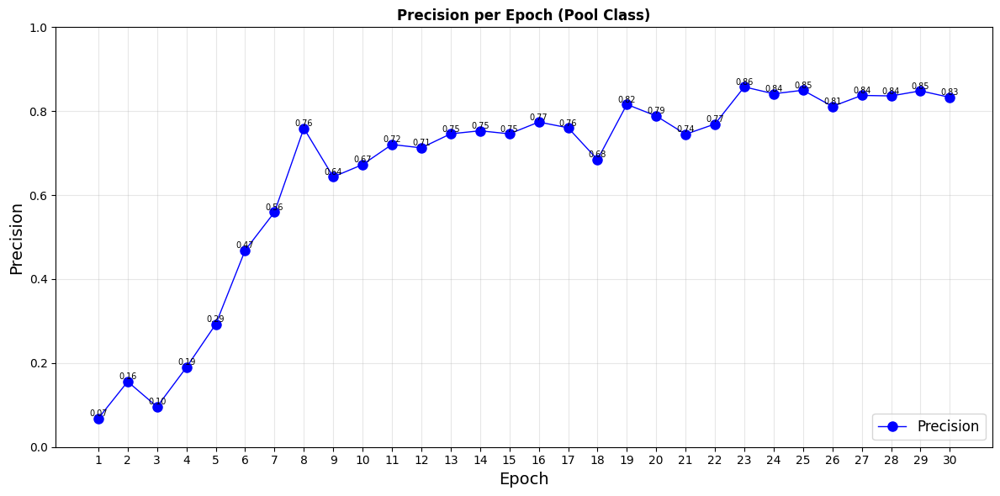

In [39]:
metrics_values = metrics["pool"]["precision"]
epochs = list(range(1, len(metrics_values) + 1))

plt.figure(figsize=(12, 6))
plt.plot(epochs, metrics_values, marker='o', color='blue', linewidth=1, markersize=8, label='Precision')
plt.title('Precision per Epoch (Pool Class)', fontsize=12, fontweight='bold')
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Precision', fontsize=14)
plt.ylim(0.0, 1.0)
plt.grid(alpha=0.3)
plt.legend(loc='lower right', fontsize=12)
plt.xticks(epochs)

for x, y in zip(epochs, metrics_values):
    plt.text(x, y + 0.005, f'{y:.2f}', ha='center', fontsize=7, color='black')

plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, "precision.png"), dpi=300)
plt.show()

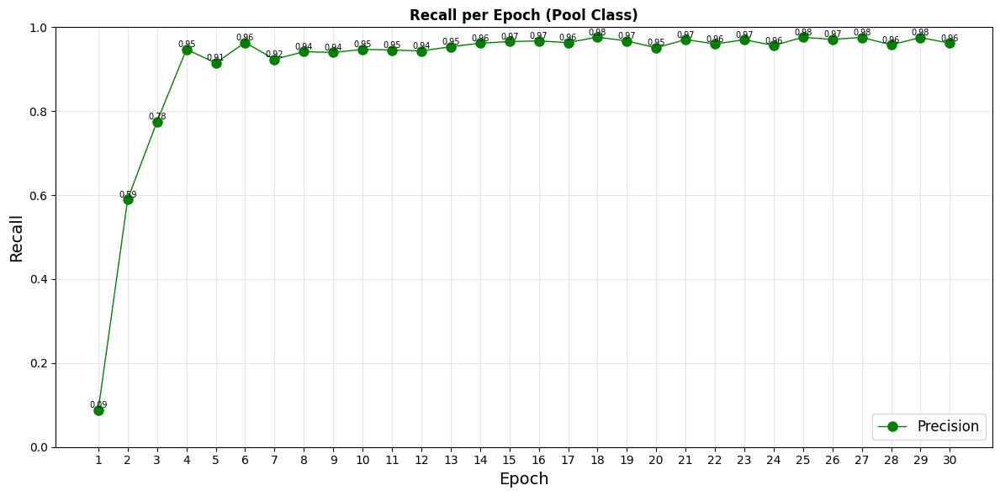

In [40]:
metrics_values = metrics["pool"]["recall"]
epochs = list(range(1, len(metrics_values) + 1))

plt.figure(figsize=(12, 6))
plt.plot(epochs, metrics_values, marker='o', color='green', linewidth=1, markersize=8, label='Precision')
plt.title('Recall per Epoch (Pool Class)', fontsize=12, fontweight='bold')
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Recall', fontsize=14)
plt.ylim(0.0, 1.0)
plt.grid(alpha=0.3)
plt.legend(loc='lower right', fontsize=12)
plt.xticks(epochs)

for x, y in zip(epochs, metrics_values):
    plt.text(x, y + 0.005, f'{y:.2f}', ha='center', fontsize=7, color='black')

plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, "recall.png"), dpi=300)
plt.show()

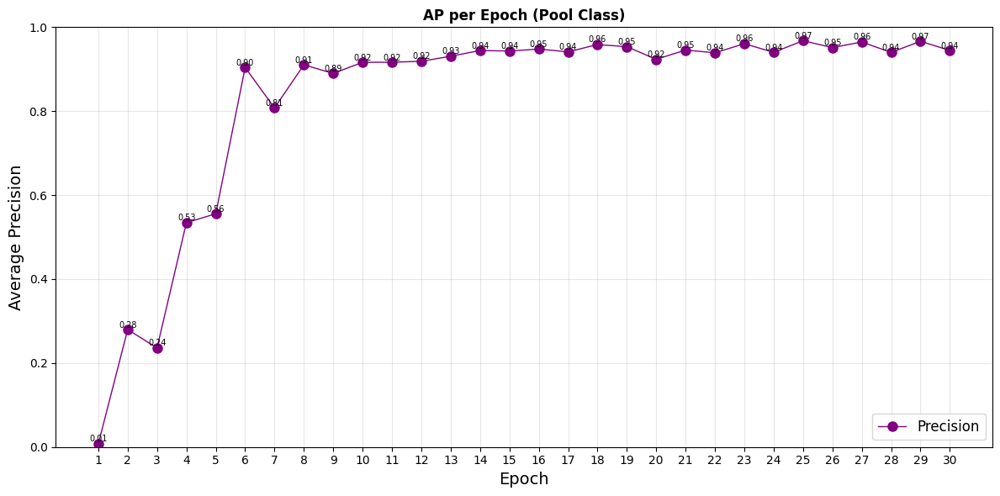

In [41]:
metrics_values = metrics["pool"]["average_precision"]
epochs = list(range(1, len(metrics_values) + 1))

plt.figure(figsize=(12, 6))
plt.plot(epochs, metrics_values, marker='o', color='purple', linewidth=1, markersize=8, label='Precision')
plt.title('AP per Epoch (Pool Class)', fontsize=12, fontweight='bold')
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Average Precision', fontsize=14)
plt.ylim(0.0, 1.0)
plt.grid(alpha=0.3)
plt.legend(loc='lower right', fontsize=12)
plt.xticks(epochs)

for x, y in zip(epochs, metrics_values):
    plt.text(x, y + 0.005, f'{y:.2f}', ha='center', fontsize=7, color='black')

plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, "ap.png"), dpi=300)
plt.show()

### Model registration

In [42]:
model_name = "swimming-pool-detectodmodel"
model_description = "swimming pool object detection model"

In [45]:
start = time.time()

print(f"🏆 Registering the best model {model_name}")

model = Model(
    path=f"azureml://jobs/{best_run.info.run_id}/outputs/artifacts/outputs/mlflow-model/",  # Model path
    name=model_name,  # Model name
    description=model_description,  # Description
    type=AssetTypes.MLFLOW_MODEL,  # Type
    tags=tags,  # Optional tags
)

registered_model = ml_client.models.create_or_update(model)

minutes, seconds = divmod((time.time() - start), 60)
print(f"✅ Done. Elapsed time = {minutes:.0f} minutes and {seconds:.0f} seconds")

🏆 Registering the best model swimming-pool-detectodmodel
✅ Done. Elapsed time = 0 minutes and 3 seconds


In [46]:
print(registered_model)

creation_context:
  created_at: '2026-02-12T06:02:31.251273+00:00'
  created_by: Marcin Szeliga
  created_by_type: User
  last_modified_at: '2026-02-12T06:02:31.251273+00:00'
  last_modified_by: Marcin Szeliga
  last_modified_by_type: User
description: swimming pool object detection model
flavors:
  python_function:
    artifacts: "{\n  \"model\": {\n    \"path\": \"artifacts/_model_impl_rw3_xuwl.pt\"\
      ,\n    \"uri\": \"/mnt/azureml/cr/j/f19b8e3df3f94ee0a15ed887d7429f52/exe/wd/_model_impl_rw3_xuwl.pt\"\
      \n  },\n  \"settings\": {\n    \"path\": \"artifacts/settings.json\",\n    \"\
      uri\": \"/mnt/azureml/cr/j/f19b8e3df3f94ee0a15ed887d7429f52/exe/wd/tmp7swfvmkd/settings.json\"\
      \n  }\n}"
    cloudpickle_version: 2.2.1
    code: ''
    env: "{\n  \"conda\": \"conda.yaml\",\n  \"virtualenv\": \"python_env.yaml\"\n\
      }"
    loader_module: mlflow.pyfunc.model
    python_model: python_model.pkl
    python_version: 3.10.19
    streamable: 'false'
id: azureml:/subscr

## 9. Managed online endpoint creation

In [47]:
online_endpoint_name = "swimmingpool-managedendpoint"
online_endpoint_description = "swimming pool object detection endpoint"

In [48]:
# Create an online endpoint
endpoint = ManagedOnlineEndpoint(
    name=online_endpoint_name,
    description=online_endpoint_description,
    auth_mode="key",
    tags=tags,
)

print(endpoint)

auth_mode: key
description: swimming pool object detection endpoint
mirror_traffic: {}
name: swimmingpool-managedendpoint
properties: {}
tags:
  cloud provider: Microsoft Azure
  data source: https://www.kaggle.com/alexj21/swimming-pool-512x512
  department: Data science
  tools: AutoML for images Azure ML
  topic: Images object detection
  usecase: Swimming pool detection 2025
  version: '1.0'
traffic: {}



In [49]:
start = time.time()

print(f"🧠 Create managed online endpoint {online_endpoint_name}... Please wait.")
ml_client.begin_create_or_update(endpoint).result()

minutes, seconds = divmod((time.time() - start), 60)
print(f"✅ Done. Elapsed time = {minutes:.0f} minutes and {seconds:.0f} seconds")

🧠 Create managed online endpoint swimmingpool-managedendpoint... Please wait.
✅ Done. Elapsed time = 1 minutes and 34 seconds


## 10. Deploying the model into the managed endpoint

In [50]:
deployment_pool_name = "pool-mlflow"
instance_type = "Standard_NC4as_T4_v3"

In [51]:
deployment = ManagedOnlineDeployment(
    name=deployment_pool_name,  # Name
    endpoint_name=online_endpoint_name,  # Endpoint name
    model=registered_model.id,  # Model
    instance_type=instance_type,  # GPU instance
    instance_count=1,  # 1 instance is ok to test
    liveness_probe=ProbeSettings(
        failure_threshold=30,  # Max failures before restart
        success_threshold=1,  # Success count before healthy
        timeout=2,  # Seconds before probe times out
        period=10,  # Interval between checks
        initial_delay=2000,  # Delay before first check
    ),
    readiness_probe=ProbeSettings(
        failure_threshold=10,  # Max failures before marking unready
        success_threshold=1,  # Seconds before probe times out
        timeout=10,  # Seconds before probe times out
        period=10,  # Interval between checks
        initial_delay=2000,  # Delay before first check
    ),
)

#### Deploy the model to the managed endpoint. Please allow some time for the process to complete, as it may take a while.

In [52]:
print("🤖 Starting to deploy the model")
print("Please wait.\n")

start = time.time()

ml_client.online_deployments.begin_create_or_update(deployment).result()

minutes, seconds = divmod((time.time() - start), 60)
print(f"\n\n✅ Done. Elapsed time = {minutes:.0f} minutes and {seconds:.0f} seconds")

Check: endpoint swimmingpool-managedendpoint exists


🤖 Starting to deploy the model
Please wait.

.................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

✅ Done. Elapsed time = 47 minutes and 36 seconds


In [53]:
print("⏳ Updating the deployment...")

start = time.time()
endpoint.traffic = {deployment_pool_name: 100}  # Routes 100% of traffic to the deployment pool
ml_client.begin_create_or_update(endpoint).result()

minutes, seconds = divmod((time.time() - start), 60)
print(f"✅ Done. Elapsed time = {minutes:.0f} minutes and {seconds:.0f} seconds")

⏳ Updating the deployment...
✅ Done. Elapsed time = 1 minutes and 33 seconds


In [54]:
endpoint = ml_client.online_endpoints.get(name=online_endpoint_name)
print(f"🎯 Endpoint traffic details: {endpoint.traffic}")

🎯 Endpoint traffic details: {'pool-mlflow': 100}


In [55]:
print(f"🏅 Endpoint scoring URI: {endpoint.scoring_uri}")

🏅 Endpoint scoring URI: https://swimmingpool-managedendpoint.eastus.inference.ml.azure.com/score


## 11. Testing the object detection deployed model

In [59]:
TEST_DIR = "test"

test_images_list = [
    os.path.join(TEST_DIR, f) for f in os.listdir(TEST_DIR)
    if os.path.splitext(f)[1].lower() in
    {'.jpg', '.jpeg', '.png', '.bmp', '.gif', '.tiff', '.webp'}
]

In [60]:
print(f"🖼️ Total of images files in '{TEST_DIR}' directory = {len(test_images_list)}")

🖼️ Total of images files in 'test' directory = 10


### Example 1

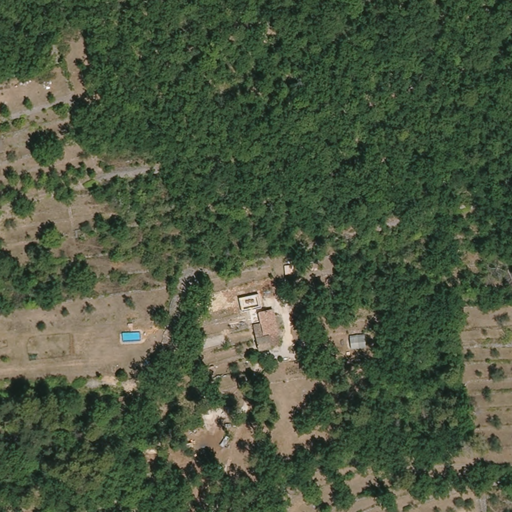

In [72]:
test_image = test_images_list[1]

img = Image.open(test_image)
img.resize((512, 512))

In [73]:
start = time.time()
results = pools_detection(test_image)
print(f"✅ Done in {(time.time() - start):.3f} seconds")

Predictions for image test/image_002.png:

💧 Number of swimming pools = 1

1: POOL with score = 70.907% 🟡
Top-Left = (0.2310, 0.6432) Bottom-Right: (0.2785, 0.6718)

✅ Done in 1.746 seconds


In [74]:
print(json.dumps(results, indent=4))

[
    {
        "boxes": [
            {
                "box": {
                    "topX": 0.23104469776153563,
                    "topY": 0.6431742191314698,
                    "bottomX": 0.2784569501876831,
                    "bottomY": 0.6718339443206787
                },
                "label": "pool",
                "score": 0.709073007106781
            }
        ]
    }
]


In [75]:
rows = []

for item in results:
    for value in item["boxes"]:
        row = {
            "topX": value["box"]["topX"],
            "topY": value["box"]["topY"],
            "bottomX": value["box"]["bottomX"],
            "bottomY": value["box"]["bottomY"],
            "label": value["label"],
            "score": value["score"]
        }
        rows.append(row)

df_predictions = pd.DataFrame(rows).sort_values(by='score', ascending=False).style.background_gradient(subset=['score'], cmap='RdYlGn')
df_predictions

,topX,topY,bottomX,bottomY,label,score
0,0.231045,0.643174,0.278457,0.671834,pool,0.709073


Total number of swimming pools = 1

01 pool = 0.71 [x:236.590, y:658.610, w:48.550, h:29.348]


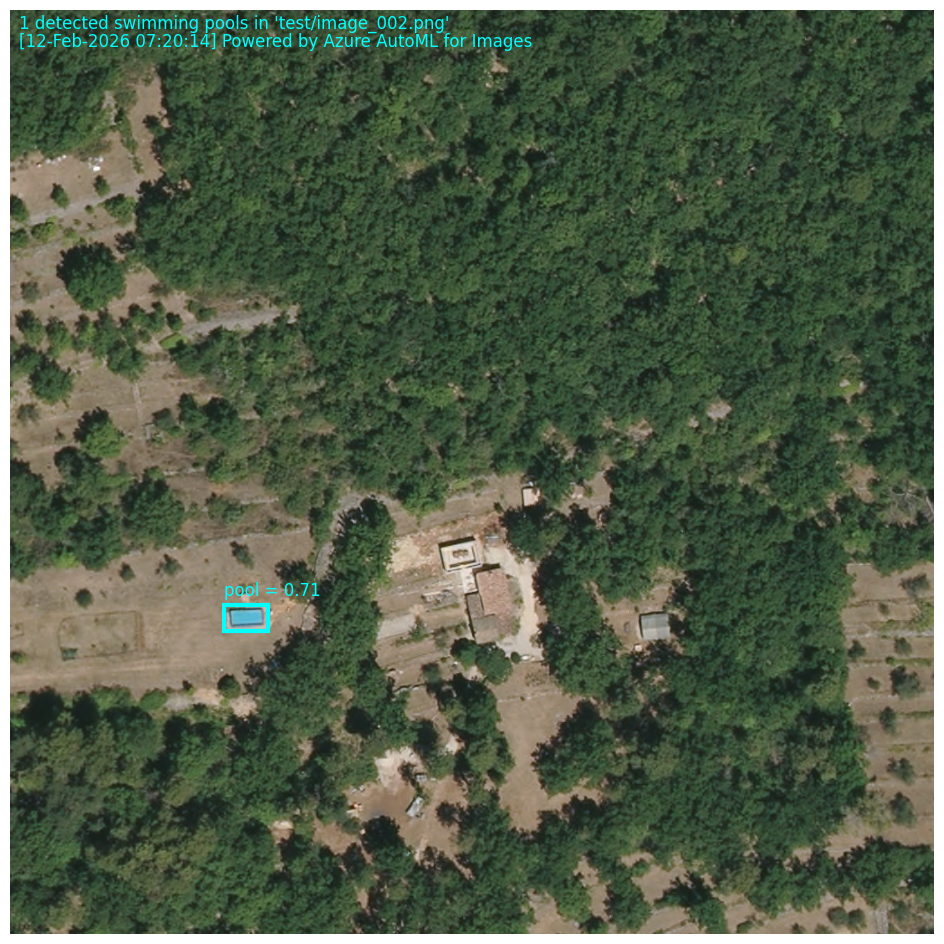

In [76]:
visualize_predictions(test_image, results, min_confidence=0.7, figsize=(12, 12))

### Example 2

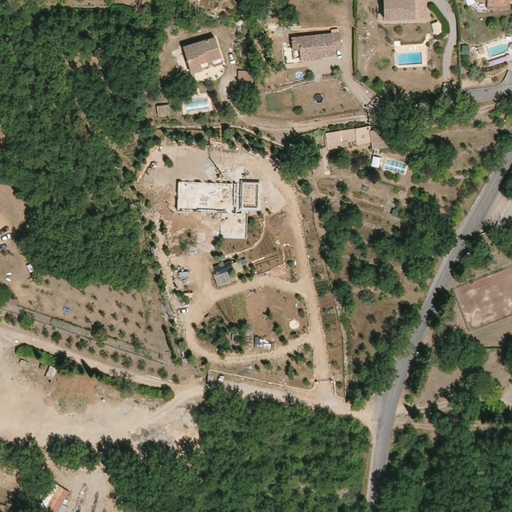

In [77]:
test_image = test_images_list[5]

img = Image.open(test_image)
img.resize((512, 512))

In [78]:
start = time.time()
results = pools_detection(test_image)
print(f"✅ Done in {(time.time() - start):.3f} seconds")

Predictions for image test/image_006.png:

💧 Number of swimming pools = 5

1: POOL with score = 78.914% 🟡
Top-Left = (0.7651, 0.0985) Bottom-Right: (0.8328, 0.1358)

2: POOL with score = 76.240% 🟡
Top-Left = (0.9424, 0.0772) Bottom-Right: (0.9963, 0.1202)

3: POOL with score = 73.045% 🟡
Top-Left = (0.3525, 0.1812) Bottom-Right: (0.4163, 0.2231)

4: POOL with score = 46.882% 🟠
Top-Left = (0.7372, 0.2991) Bottom-Right: (0.8007, 0.3438)

5: POOL with score = 13.961% 🟠
Top-Left = (0.5758, 0.1400) Bottom-Right: (0.5962, 0.1581)

✅ Done in 1.679 seconds


In [79]:
print(json.dumps(results, indent=4))

[
    {
        "boxes": [
            {
                "box": {
                    "topX": 0.7650742053985595,
                    "topY": 0.09846583008766174,
                    "bottomX": 0.8328462600708008,
                    "bottomY": 0.13582158088684082
                },
                "label": "pool",
                "score": 0.7891359925270081
            },
            {
                "box": {
                    "topX": 0.9423822402954102,
                    "topY": 0.07722780108451843,
                    "bottomX": 0.9963438034057617,
                    "bottomY": 0.12015771865844727
                },
                "label": "pool",
                "score": 0.7623994946479797
            },
            {
                "box": {
                    "topX": 0.3525251865386963,
                    "topY": 0.18116520643234252,
                    "bottomX": 0.4163248538970947,
                    "bottomY": 0.22305433750152587
                },
                "l

In [80]:
rows = []

for item in results:
    for value in item["boxes"]:
        row = {
            "topX": value["box"]["topX"],
            "topY": value["box"]["topY"],
            "bottomX": value["box"]["bottomX"],
            "bottomY": value["box"]["bottomY"],
            "label": value["label"],
            "score": value["score"]
        }
        rows.append(row)

df_predictions = pd.DataFrame(rows).sort_values(by='score', ascending=False).style.background_gradient(subset=['score'], cmap='RdYlGn')
df_predictions

,topX,topY,bottomX,bottomY,label,score
0,0.765074,0.098466,0.832846,0.135822,pool,0.789136
1,0.942382,0.077228,0.996344,0.120158,pool,0.762399
2,0.352525,0.181165,0.416325,0.223054,pool,0.730454
3,0.737208,0.299150,0.800719,0.343821,pool,0.468816
4,0.575758,0.140049,0.596191,0.158124,pool,0.139615


Total number of swimming pools = 5

01 pool = 0.79 [x:783.436, y:100.829, w:69.399, h:38.252]
02 pool = 0.76 [x:964.999, y:79.081, w:55.257, h:43.960]
03 pool = 0.73 [x:360.986, y:185.513, w:65.331, h:42.894]


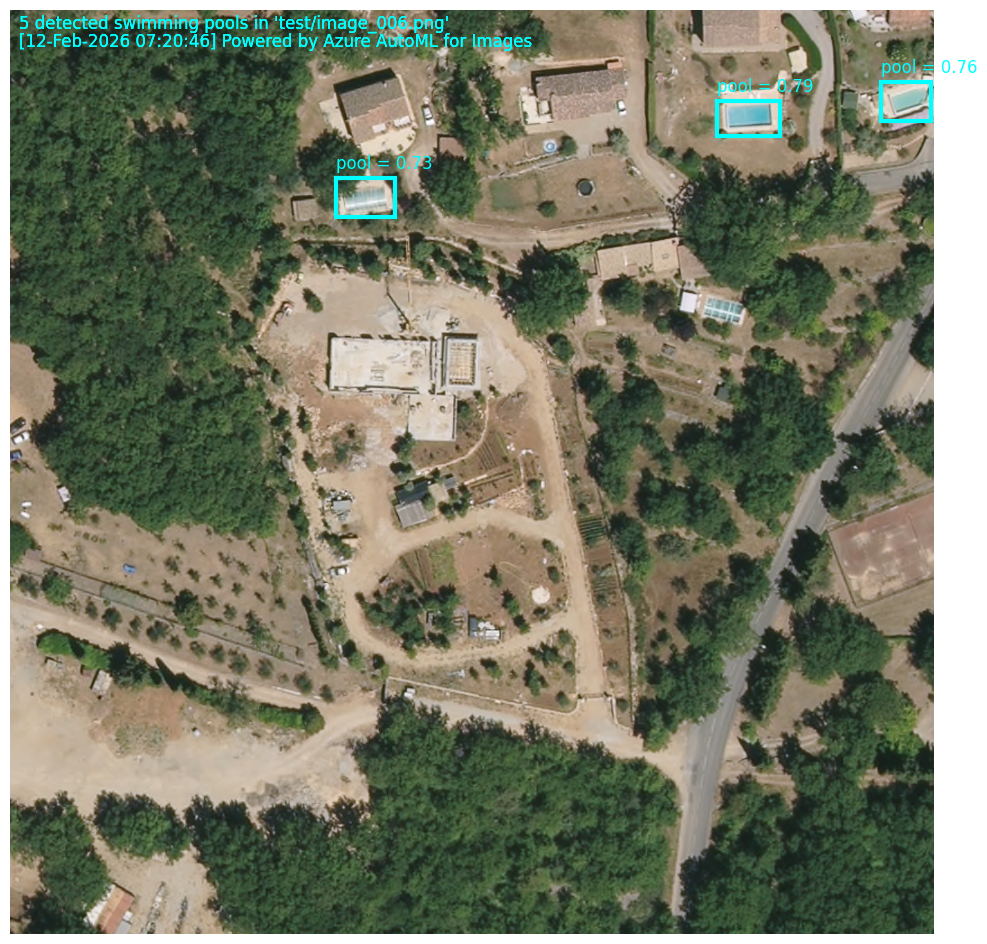

In [81]:
visualize_predictions(test_image, results, min_confidence=0.5, figsize=(12, 12))

### Example 3

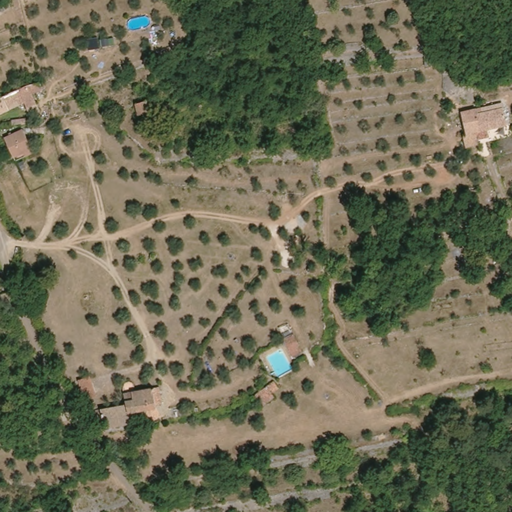

In [82]:
test_image = test_images_list[0]

img = Image.open(test_image)
img.resize((512, 512))

In [83]:
start = time.time()
results = pools_detection(test_image)
print(f"✅ Done in {(time.time() - start):.3f} seconds")

Predictions for image test/image_001.png:

💧 Number of swimming pools = 2

1: POOL with score = 84.275% 🟢
Top-Left = (0.5149, 0.6794) Bottom-Right: (0.5718, 0.7422)

2: POOL with score = 78.333% 🟡
Top-Left = (0.2407, 0.0283) Bottom-Right: (0.2953, 0.0634)

✅ Done in 1.518 seconds


In [84]:
print(json.dumps(results, indent=4))

[
    {
        "boxes": [
            {
                "box": {
                    "topX": 0.514885663986206,
                    "topY": 0.6793886661529541,
                    "bottomX": 0.5718044757843017,
                    "bottomY": 0.7421762943267822
                },
                "label": "pool",
                "score": 0.8427488207817078
            },
            {
                "box": {
                    "topX": 0.24068126678466797,
                    "topY": 0.028257650136947633,
                    "bottomX": 0.29526395797729493,
                    "bottomY": 0.06337845921516419
                },
                "label": "pool",
                "score": 0.7833340167999268
            }
        ]
    }
]


In [85]:
rows = []

for item in results:
    for value in item["boxes"]:
        row = {
            "topX": value["box"]["topX"],
            "topY": value["box"]["topY"],
            "bottomX": value["box"]["bottomX"],
            "bottomY": value["box"]["bottomY"],
            "label": value["label"],
            "score": value["score"]
        }
        rows.append(row)

df_predictions = pd.DataFrame(rows).sort_values(by='score', ascending=False).style.background_gradient(subset=['score'], cmap='RdYlGn')
df_predictions

,topX,topY,bottomX,bottomY,label,score
0,0.514886,0.679389,0.571804,0.742176,pool,0.842749
1,0.240681,0.028258,0.295264,0.063378,pool,0.783334


Total number of swimming pools = 2

01 pool = 0.84 [x:527.243, y:695.694, w:58.285, h:64.295]
02 pool = 0.78 [x:246.458, y:28.936, w:55.893, h:35.964]


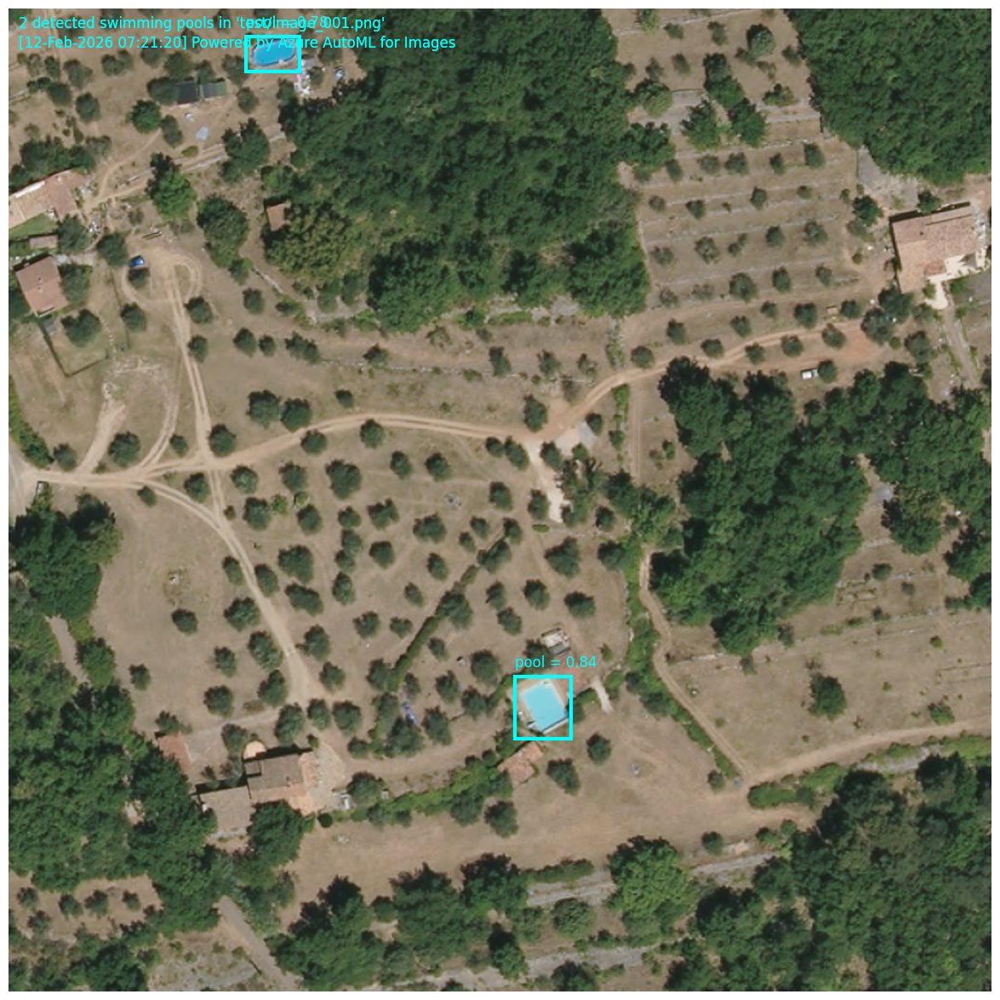

In [86]:
visualize_predictions(test_image, results, min_confidence=0.7, figsize=(15, 15))